Conversation 1: https://chatgpt.com/share/66f0d0ab-742c-8010-b518-80e09becd452 

Conversation 2: https://chatgpt.com/share/66f0d9e0-8144-8010-8bde-8ec8a225b919

# Pre-lecture homework

#### 1: 

In [2]:
#https://stackoverflow.com/questions/52771328/plotly-chart-not-showing-in-jupyter-notebook
import plotly.offline as pyo
import plotly.express as px
# Set notebook mode to work in offline
pyo.init_notebook_mode()

In [3]:
import pandas as pd 
df = pd.read_csv("https://raw.githubusercontent.com/mwaskom/seaborn-data/master/penguins.csv")

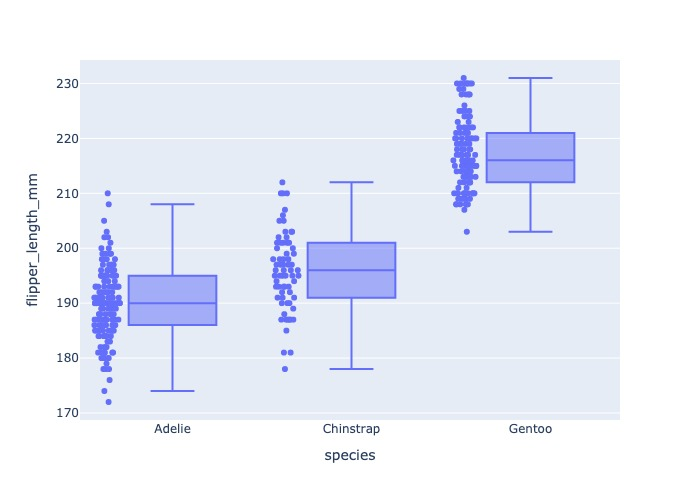

In [6]:
fig = px.box(df, x="species", y="flipper_length_mm", points="all")
fig.show(renderer='jpg')

In [173]:
adelie_df = df[df['species']=='Adelie']
gentoo_df = df[df['species']=='Gentoo']
chinstrap_df = df[df['species']=='Chinstrap']

**Need to mark mean, median, and range, interquartile range, and 25%-75%**.


In [174]:
print('MEAN VALUES: \n', 'adelie: ', adelie_df.describe()['flipper_length_mm']['mean'], '\n gentoo: ', gentoo_df.describe()['flipper_length_mm']['mean'], '\n chinstrap: ', chinstrap_df.describe()['flipper_length_mm']['mean'])

MEAN VALUES: 
 adelie:  189.95364238410596 
 gentoo:  217.1869918699187 
 chinstrap:  195.8235294117647


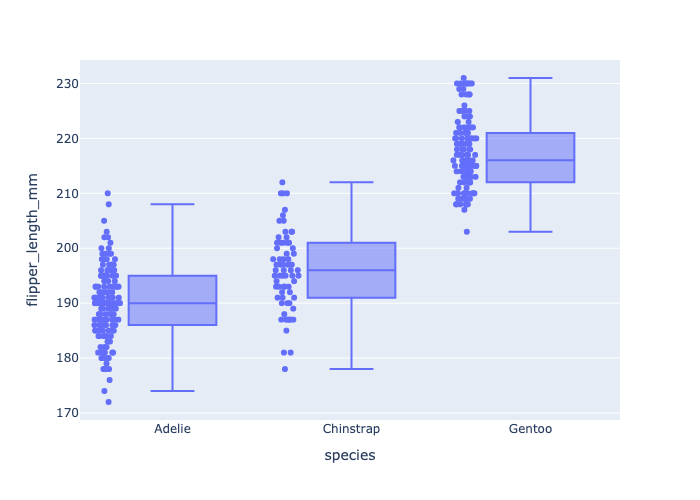

In [7]:
fig = px.box(df, x="species", y="flipper_length_mm", points="all")
fig.show(renderer='png')

Adelie: 
min=172, q1=186, med=190, q3=195, max=210 

Chinstrap: 
min=178, q1=191, med=196, q3=201, max=212

Gentoo: 
min=203, q1=212, med=216, q3=221, max=231 

**Adelie histogram:**

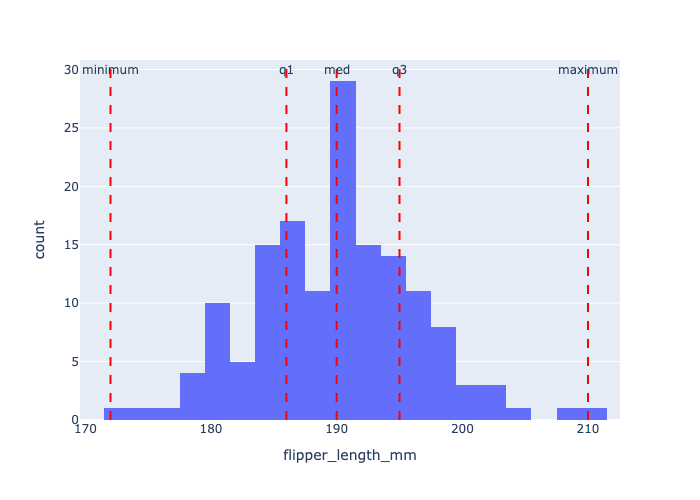

In [176]:

# df = px.data.tips()
fig = px.histogram(adelie_df, x="flipper_length_mm")

def create_line(x_value, text_value): 
    fig.add_vline(x=x_value, line_width=2, line_dash="dash", line_color="red")

    fig.add_annotation(
        x=x_value, y=30, # Position the label at the top of the histogram
        text=text_value, # Label text
        ax=0, # Horizontal shift of arrow
        ay=-40, # Vertical shift of arrow
        showarrow=False
    )

create_line(172, 'minimum')
create_line(186, 'q1')
create_line(190, 'med')
create_line(195, 'q3')
create_line(210, 'maximum')

fig.show(renderer='png') # USE `fig.show(renderer="png")` FOR ALL GitHub and MarkUs SUBMISSIONS


#### 2.

In [177]:
!pip3 install seaborn 

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.1.2 -> 24.2
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip


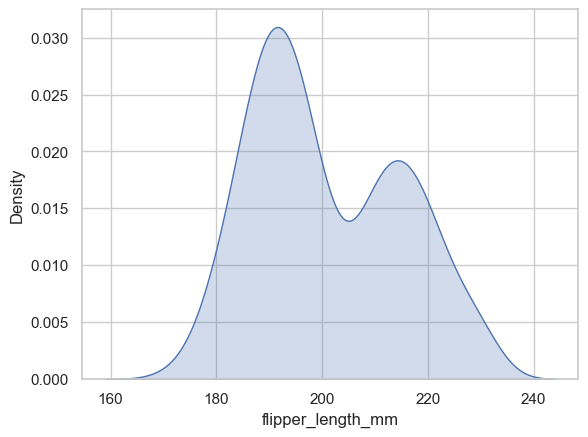

In [178]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# Example Pandas DataFrame with random data
df = df

# Create KDE plot using Seaborn
sns.kdeplot(data=df, x='flipper_length_mm', fill=True)

# Show the plot
plt.show()


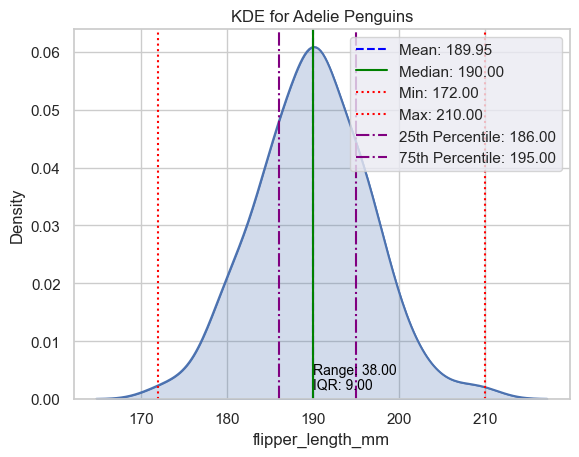

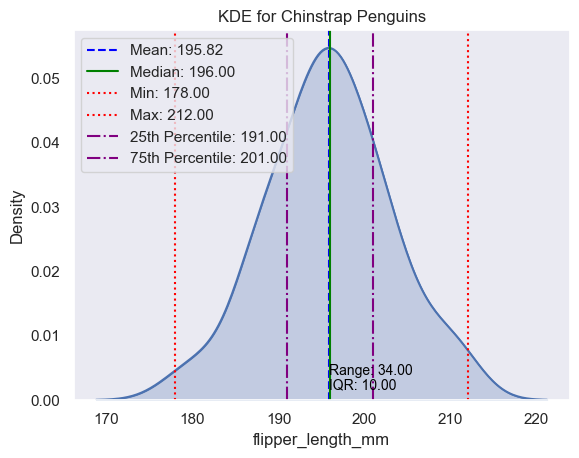

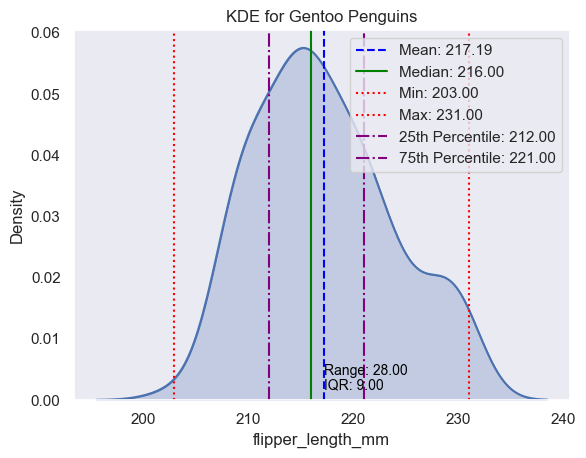

In [179]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Example of penguins dataset (replace with your actual dataset)
# Assuming your dataset has columns 'species' and 'value' (replace 'value' with the appropriate column)

# Function to calculate and plot KDE with summary statistics
def plot_kde_with_stats(df, species_name):
    # Filter data for the specific species
    species_data = df[df['species'] == species_name]['flipper_length_mm'].dropna()  # Replace 'bill_length_mm' with desired column

    # Calculate summary statistics
    mean = species_data.mean()
    median = species_data.median()
    min_value = species_data.min()
    max_value = species_data.max()
    q25 = species_data.quantile(0.25)
    q75 = species_data.quantile(0.75)
    iqr = q75 - q25

    # Create the KDE plot
    sns.kdeplot(species_data, fill=True)
    sns.set_style('dark')

    kde_max = sns.kdeplot(species_data).get_lines()[0].get_data()[1].max()
    
    
    # Add vertical lines for summary statistics
    plt.axvline(mean, color='blue', linestyle='--', label=f'Mean: {mean:.2f}')
    plt.axvline(median, color='green', linestyle='-', label=f'Median: {median:.2f}')
    plt.axvline(min_value, color='red', linestyle=':', label=f'Min: {min_value:.2f}')
    plt.axvline(max_value, color='red', linestyle=':', label=f'Max: {max_value:.2f}')
    plt.axvline(q25, color='purple', linestyle='-.', label=f'25th Percentile: {q25:.2f}')
    plt.axvline(q75, color='purple', linestyle='-.', label=f'75th Percentile: {q75:.2f}')
    
    # Add text annotations for IQR and range
    plt.text(mean, kde_max * 0.03, f'IQR: {iqr:.2f}', color='black', fontsize=10)
    plt.text(mean, kde_max * 0.07, f'Range: {max_value-min_value:.2f}', color='black', fontsize=10)
    
    # Add title and legend
    plt.title(f'KDE for {species_name} Penguins')
    plt.legend()
    plt.show()

# Plot KDE for each species
species_list = ['Adelie', 'Chinstrap', 'Gentoo']

for species in species_list:
    plot_kde_with_stats(df, species)


#### 3.

The main difference between histograms and kernel density estimators is that **histograms** are discrete, prompting the user to specify the ``nbins`` value to determine how specific they want each interval to be, while **kernel density estimators** are continuous (and thus plot density on the y-axis compared to frequency on histograms).

I prefer **histograms** as it displays the actual frequencies of each statistic, compared to **KDEs** which don't really tell you the scale of how many penguins a given density represents. 

#### 4. 

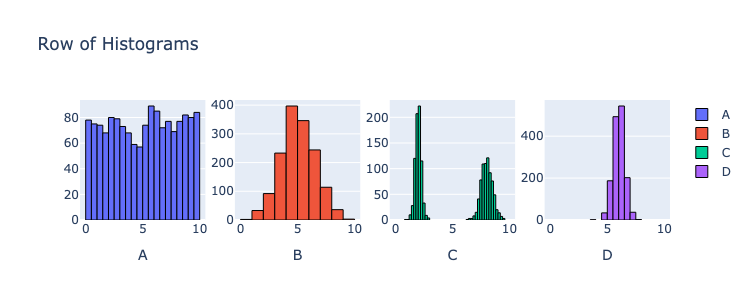

In [8]:
from scipy import stats
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

n=1500
data1 = stats.uniform.rvs(0, 10, size=n)
data2 = stats.norm.rvs(5, 1.5, size=n)
data3 = np.r_[stats.norm.rvs(2, 0.25, size=int(n/2)), stats.norm.rvs(8, 0.5, size=int(n/2))]
data4 = stats.norm.rvs(6, 0.5, size=n)

fig = make_subplots(rows=1, cols=4)

fig.add_trace(go.Histogram(x=data1, name='A', nbinsx=30, marker=dict(line=dict(color='black', width=1))), row=1, col=1)
fig.add_trace(go.Histogram(x=data2, name='B', nbinsx=15, marker=dict(line=dict(color='black', width=1))), row=1, col=2)
fig.add_trace(go.Histogram(x=data3, name='C', nbinsx=45, marker=dict(line=dict(color='black', width=1))), row=1, col=3)
fig.add_trace(go.Histogram(x=data4, name='D', nbinsx=15, marker=dict(line=dict(color='black', width=1))), row=1, col=4)

fig.update_layout(height=300, width=750, title_text="Row of Histograms")
fig.update_xaxes(title_text="A", row=1, col=1)
fig.update_xaxes(title_text="B", row=1, col=2)
fig.update_xaxes(title_text="C", row=1, col=3)
fig.update_xaxes(title_text="D", row=1, col=4)
fig.update_xaxes(range=[-0.5, 10.5])

for trace in fig.data:
    trace.xbins = dict(start=0, end=10)
    
# This code was produced by just making requests to Microsoft Copilot (../CHATLOG/wk3/COP/SLS/0001_concise_makeAplotV1.md)

fig.show(renderer='png') # USE `fig.show(renderer="png")` FOR ALL GitHub and MarkUs SUBMISSIONS

- A: A and C. 
- B: A and B. 
- C: B and D. 
- D: A and D. 

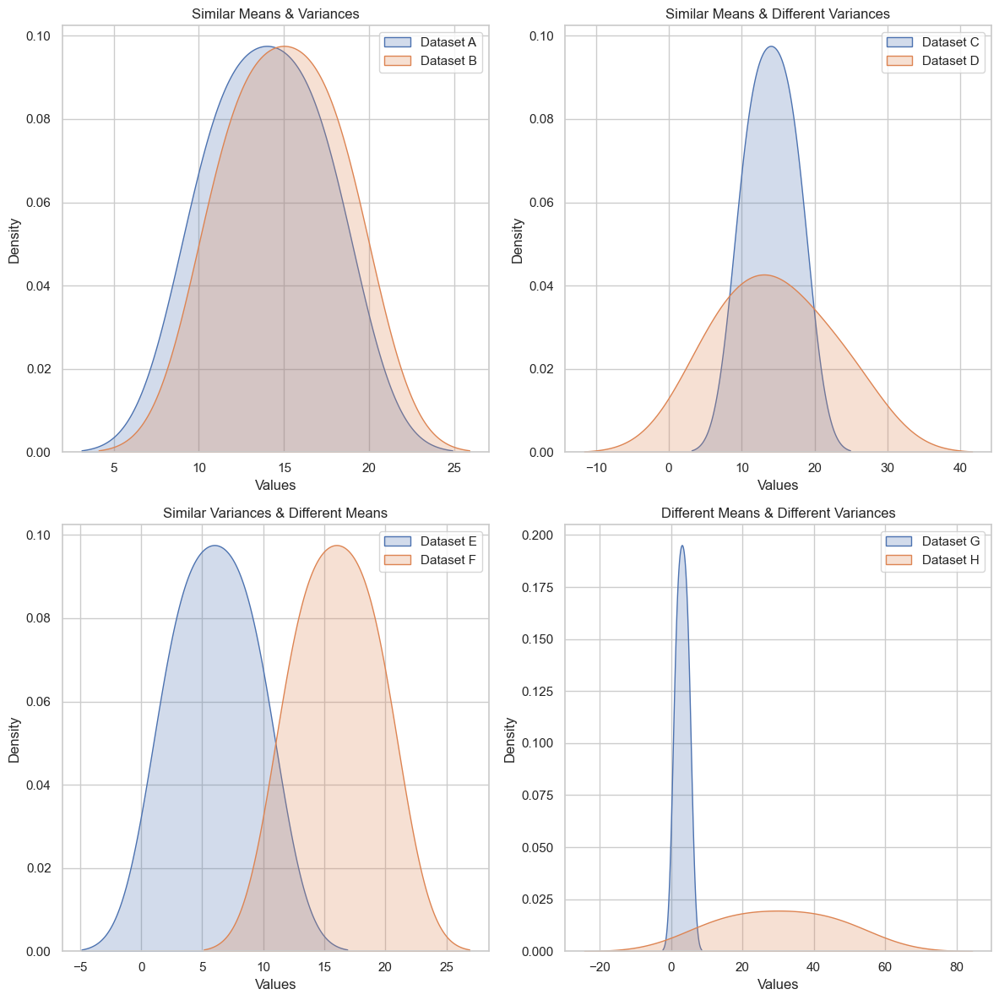

In [81]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for the plots
sns.set(style="whitegrid")

# Define the datasets
datasets = {
    "Similar Means & Variances": {
        "Dataset A": [10, 12, 14, 16, 18],
        "Dataset B": [11, 13, 15, 17, 19],
    },
    "Similar Means & Different Variances": {
        "Dataset C": [10, 12, 14, 16, 18],
        "Dataset D": [5, 10, 14, 18, 25],
    },
    "Similar Variances & Different Means": {
        "Dataset E": [2, 4, 6, 8, 10],
        "Dataset F": [12, 14, 16, 18, 20],
    },
    "Different Means & Different Variances": {
        "Dataset G": [1, 2, 3, 4, 5],
        "Dataset H": [10, 20, 30, 40, 50],
    }
}

# Create plots for each category
plt.figure(figsize=(12, 12))

for i, (title, data) in enumerate(datasets.items(), start=1):
    plt.subplot(2, 2, i)
    for label, values in data.items():
        sns.kdeplot(values, label=label, fill=True)
    plt.title(title)
    plt.xlabel('Values')
    plt.ylabel('Density')
    plt.legend()

plt.tight_layout()
plt.show()


Here’s a summary of our conversation:

1. **Kernel Density Estimation (KDE)**: You asked about KDE, and I explained it as a non-parametric way to estimate the probability density function of a random variable, smoothing out the distribution using kernels.

2. **Plotting KDE in Python**: You requested Python code to plot a KDE using the Seaborn library on a Pandas DataFrame. I provided a code example that included vertical lines for summary statistics (mean, median, etc.).

3. **Adding Labels to KDE Plots**: You asked how to label summary statistics on a KDE plot. I offered an example that included mean, median, range, IQR, and percentiles, using vertical lines and annotations.

4. **KDE for Multiple Datasets**: You wanted to create KDE plots for three penguin species, so I provided code that filters data for each species and labels the summary statistics accordingly.

5. **Error Handling**: You encountered an error regarding non-finite values when using `plt.text`. I provided a revised version of the code that addressed this issue by handling missing values and adjusting text placement.

6. **Understanding Variance**: You requested a brief explanation of variance, which I provided, highlighting its role in measuring the spread of data around the mean.

7. **Examples of Distributions**: You asked for examples of datasets with different combinations of means and variances, and I provided four categories with specific datasets.

8. **Visualizing Distributions**: Finally, you asked if I could use images of distributions to illustrate the examples provided. I shared Python code to generate KDE plots for each set of datasets, allowing for a visual comparison.

If you need any further details or have more questions, feel free to ask!

# Postlecture HW

#### 5: 

When **mean < median**, the graph is skewed to the right (higher concentration of values on the left of the median). 

When **mean > median**, the graph is skewed to the left (higher concentration on the right). 

When **mean = median**, the graph is not skewed. 


The following code generates a random continuous distribution using the ``stats.gamma.rvs`` function. ``sample1`` generates 1000 from a gamma distribution, while ``sample2`` generates 1000 from the same distribution, but just making all values negative, essentially inverting the right-skewed distribution to a left-skewed distribution.

The patterns explained above can be seen in the graphs. 
- Graph 1 is right skewed, with median < mean.
- Graph 2 is left skewed, with median > mean.
- Graph 3 has median ~= mean, and is neither left nor right skewed. 

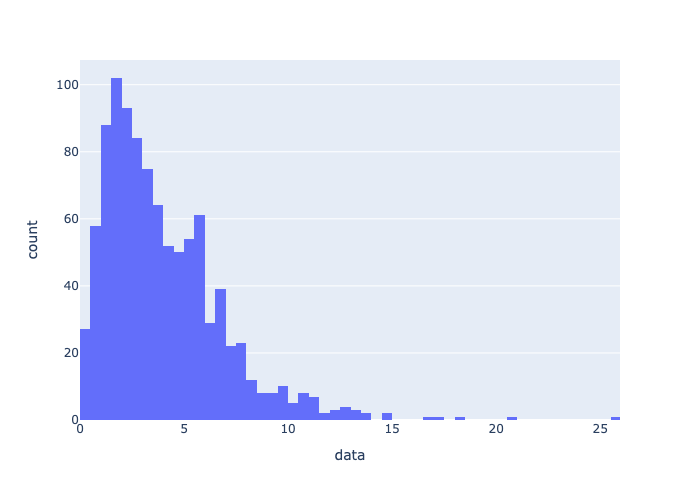

MEDIAN: [3.27143916] MEAN: 4.00617060484597


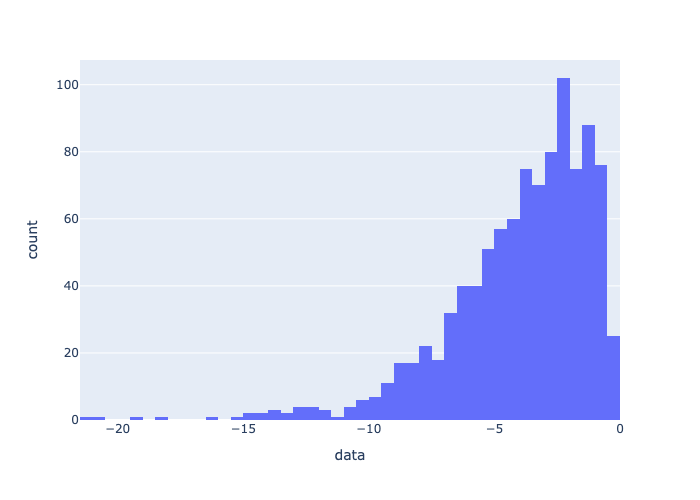

MEDIAN: [-3.39799408] MEAN: -4.004696198258932


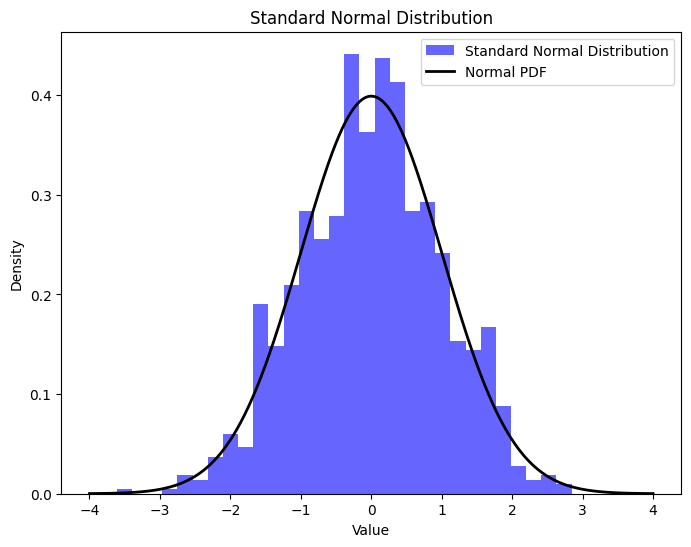

Sample Mean: 0.00014718287449633837
Sample Median: 0.020713770836586


In [5]:
from scipy import stats
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

""" RIGHT AND LEFT-SKEWED DISTRIBUTIONS """
 
sample1 = stats.gamma(a=2, scale=2).rvs(size=1000)
fig1 = px.histogram(pd.DataFrame({'data': sample1}), x="data")
fig1.update_xaxes(range=[0, fig1.data[0].x.max()])  # Adjust upper limit as needed
fig1.show(renderer='png')
# USE `fig1.show(renderer="png")` FOR ALL GitHub and MarkUs SUBMISSIONS

sample1.mean()
print('MEDIAN:', np.quantile(sample1, [0.5]), 'MEAN:', np.mean(sample1)) # median

sample2 = -stats.gamma(a=2,scale=2).rvs(size=1000)

fig2 = px.histogram(pd.DataFrame({'data': sample2}), x="data")
# fig2.update_xaxes(range=[0, fig2.data[0].x.max()])  # Adjust upper limit as needed
fig2.show(renderer='png')
print('MEDIAN:', np.quantile(sample2, [0.5]), 'MEAN:', np.mean(sample2)) # median

""" NORMAL DISTRIBUTION """ 

# Generate a standard normal distribution
n_samples = 1000
normal_sample = np.random.normal(loc=0, scale=1, size=n_samples)

# Plotting the distribution
plt.figure(figsize=(8, 6))
plt.hist(normal_sample, bins=30, density=True, alpha=0.6, color='b', label='Standard Normal Distribution')

# Overlaying the theoretical PDF
x = np.linspace(-4, 4, 1000)
normal_pdf = stats.norm.pdf(x, loc=0, scale=1)
plt.plot(x, normal_pdf, 'k', linewidth=2, label='Normal PDF')

plt.title('Standard Normal Distribution')
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()
plt.show()

# Print the mean and median
print("Sample Mean:", normal_sample.mean())
print("Sample Median:", np.median(normal_sample))


#### 6:

In [2]:
import pandas as pd
df = pd.read_csv("https://raw.githubusercontent.com/seankross/lego/master/data-tidy/legosets.csv")

In [3]:
df.describe()

,Year,Pieces,Minifigures,GBP_MSRP,USD_MSRP,CAD_MSRP,EUR_MSRP
count,6172.000000,6060.000000,3500.000000,4192.000000,5817.000000,1982.000000,1773.000000
mean,2004.712087,215.168647,2.845429,23.448616,27.896813,46.337482,35.982640
std,8.914686,356.197637,2.720965,31.929169,39.320153,58.458461,46.611047
min,1971.000000,0.000000,1.000000,0.000000,0.000000,2.990000,0.000000
25%,2000.000000,30.000000,1.000000,5.990000,6.000000,12.990000,9.990000
50%,2006.000000,82.000000,2.000000,12.990000,14.990000,24.990000,19.990000
75%,2012.000000,256.250000,4.000000,29.990000,34.990000,54.990000,39.990000
max,2015.000000,5922.000000,32.000000,509.990000,789.990000,789.990000,699.990000


**Seeing number of pieces in each Lego set:**

In [4]:
data = df['Pieces']
data.describe()

count    6060.000000
mean      215.168647
std       356.197637
min         0.000000
25%        30.000000
50%        82.000000
75%       256.250000
max      5922.000000
Name: Pieces, dtype: float64

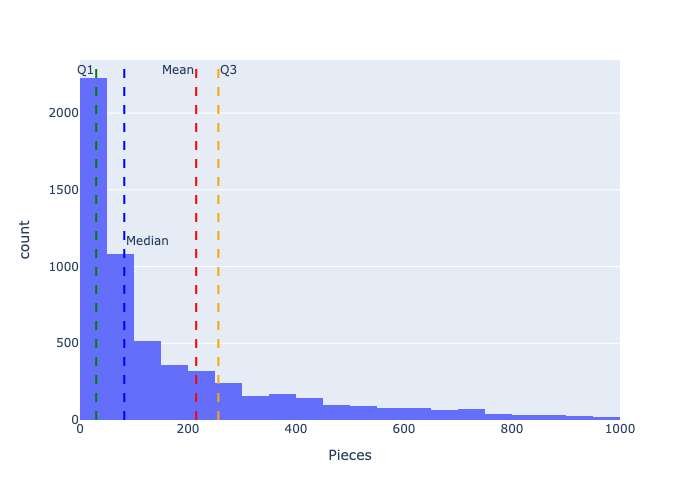

In [5]:
import pandas as pd
import plotly.express as px

# Assuming df is your existing DataFrame
fig1 = px.histogram(df, x="Pieces")
fig1.update_xaxes(range=[0, 1000])  # Adjust upper limit as needed

# Calculate statistics
mean_value = df['Pieces'].mean()
median_value = df['Pieces'].median()
quartiles = df['Pieces'].quantile([0.25, 0.5, 0.75])

# Add mean, median, and quartile lines
fig1.add_vline(x=mean_value, line_dash="dash", line_color="red", annotation_text="Mean", annotation_position="top left")
fig1.add_vline(x=median_value, line_dash="dash", line_color="blue", annotation_text="Median", annotation_position="right")
fig1.add_vline(x=quartiles[0.25], line_dash="dash", line_color="green", annotation_text="Q1", annotation_position="top left")
fig1.add_vline(x=quartiles[0.75], line_dash="dash", line_color="orange", annotation_text="Q3", annotation_position="top right")

# Show the plot
fig1.show(renderer='png')


**Median < mean**, so the distribution is skewed to the right! 

Seems the average number of pieces per set is 215. 

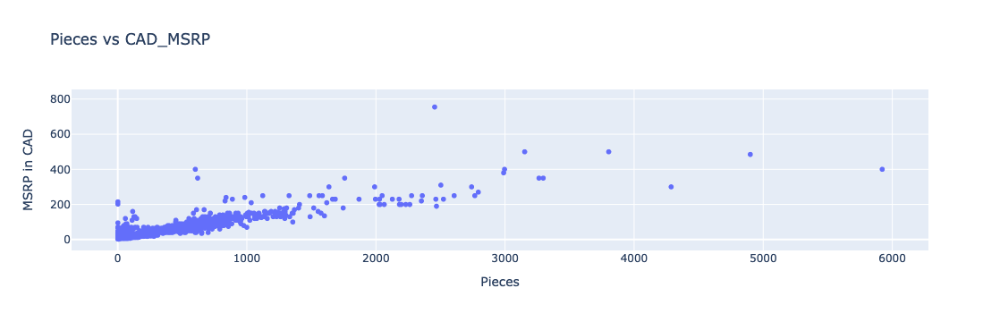

In [8]:
import pandas as pd
import plotly.express as px

# Assuming your DataFrame is df
# df = pd.read_csv('your_data.csv')  # Uncomment this if you need to load the data from a CSV

# Create a scatter plot
fig = px.scatter(df, x='Pieces', y='CAD_MSRP', 
                 title="Pieces vs CAD_MSRP",
                 labels={"pieces": "Number of Pieces", "CAD_MSRP": "MSRP in CAD"})  # Optional: Adds a trendline

# Show the plot
fig.show(renderer='png')


#### 7. 

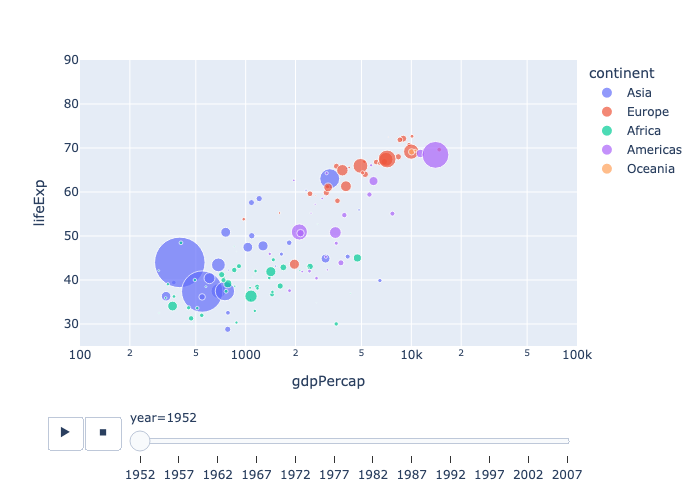

In [10]:
import plotly.express as px
df = px.data.gapminder()
fig = px.scatter(df, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country",
           size="pop", color="continent", hover_name="country",
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])
fig.show(renderer='png')

#### 8.

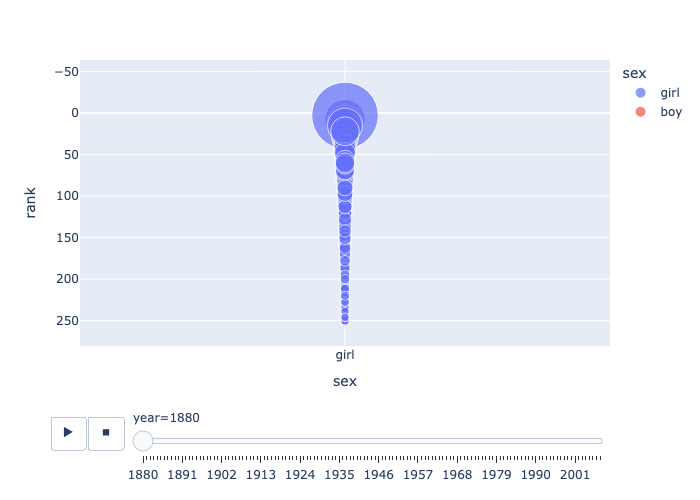

In [11]:
import pandas as pd

bn = pd.read_csv('https://raw.githubusercontent.com/hadley/data-baby-names/master/baby-names.csv')
bn['name'] = bn['name']+" "+bn['sex'] # make identical boy and girl names distinct
bn['rank'] = bn.groupby('year')['percent'].rank(ascending=False)
bn = bn.sort_values(['name','year'])
# the next three lines create the increaes or decrease in name prevalence from the last year 
bn['percent change'] = bn['percent'].diff()
new_name = [True]+list(bn.name[:-1].values!=bn.name[1:].values)
bn.loc[new_name,'percentage change'] = bn.loc[new_name,'percent'] 
bn = bn.sort_values('year')
bn = bn[bn.percent>0.001] # restrict to "common" names
fig = px.scatter(bn, x="sex", y="rank", animation_frame="year", animation_group="name",
                 size="percent", color="sex", hover_name="name",size_max=50, range_x=[-0.005,0.005]) # range_y removed
fig.update_yaxes(autorange='reversed') # this lets us put rank 1 on the top
fig.show(renderer='png') # USE `fig.show(renderer="png")` FOR ALL GitHub and MarkUs SUBMISSIONS

#### 9: YES

Here's a summary of our conversation so far:

1. **Mean and Median in Relation to Skewness**: We discussed how the mean and median relate to skewness, where right skewness shows mean > median, and left skewness shows mean < median.

2. **Scipy Gamma Distribution**: You learned about `scipy.stats.gamma`, which provides functions for working with the gamma distribution, including generating random variates and calculating probabilities.

3. **Creating Left-Skewed Distributions**: We explored how to create a left-skewed distribution, primarily using a beta distribution or by taking the negative of a gamma distribution.

4. **Generating Gamma and Normal Distributions**: We created a gamma distribution that resembles a normal distribution by selecting appropriate parameters and plotted it. 

5. **Plotting a Standard Normal Distribution**: You received code to generate and plot a standard normal distribution, including the mean and median.

6. **Plotting a DataFrame Column**: We discussed how to plot a histogram of a specific column in a Pandas DataFrame using Matplotlib and how to use Plotly for the same purpose.

7. **Calculating and Displaying Statistics on a Plot**: Finally, we looked at how to calculate the mean, median, and quartiles of a DataFrame column and display those values directly on the histogram using Plotly annotations.

If you have any further questions or need clarification on any topic, feel free to ask!